# Ejercicio 1: Preparación del Ambiente de Trabajo

In [23]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")
plt.rcParams['figure.figsize'] = (8, 4)
plt.rcParams['figure.dpi'] = 200
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV
from sklearn.metrics import median_absolute_error, mean_squared_error

In [24]:
df = pd.read_csv('winequality-red.csv')

In [25]:
df.head(3)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5


In [26]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


# Ejercicio 2: Análisis exploratorio

### Tipo de datos de cada columna.

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


### Outliers univariados

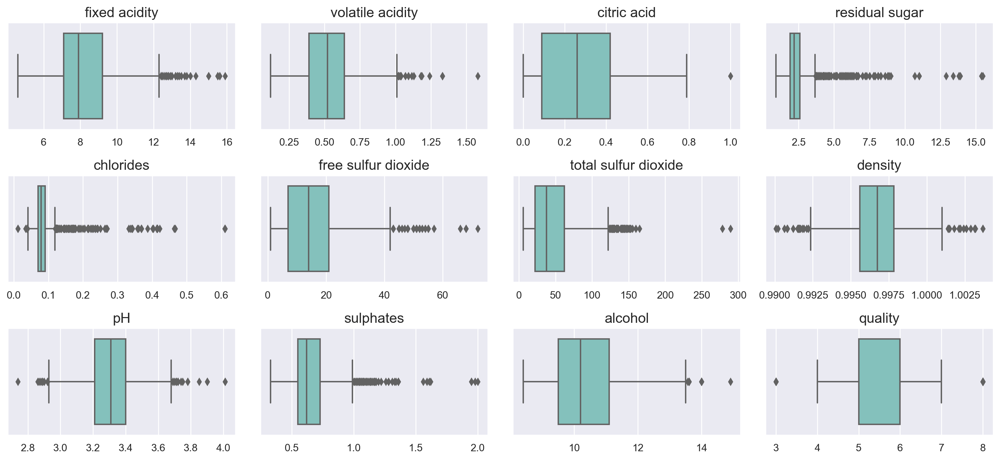

In [28]:
cols = 4
rows = 3
plt.figure(figsize=(15,7))
for index, value in enumerate(df.columns):
    plt.subplot(rows, cols, index + 1)
    sns.boxplot(x=df[value], palette='GnBu')
    plt.title(value, fontsize=15)
    plt.xlabel('')
    plt.tight_layout()

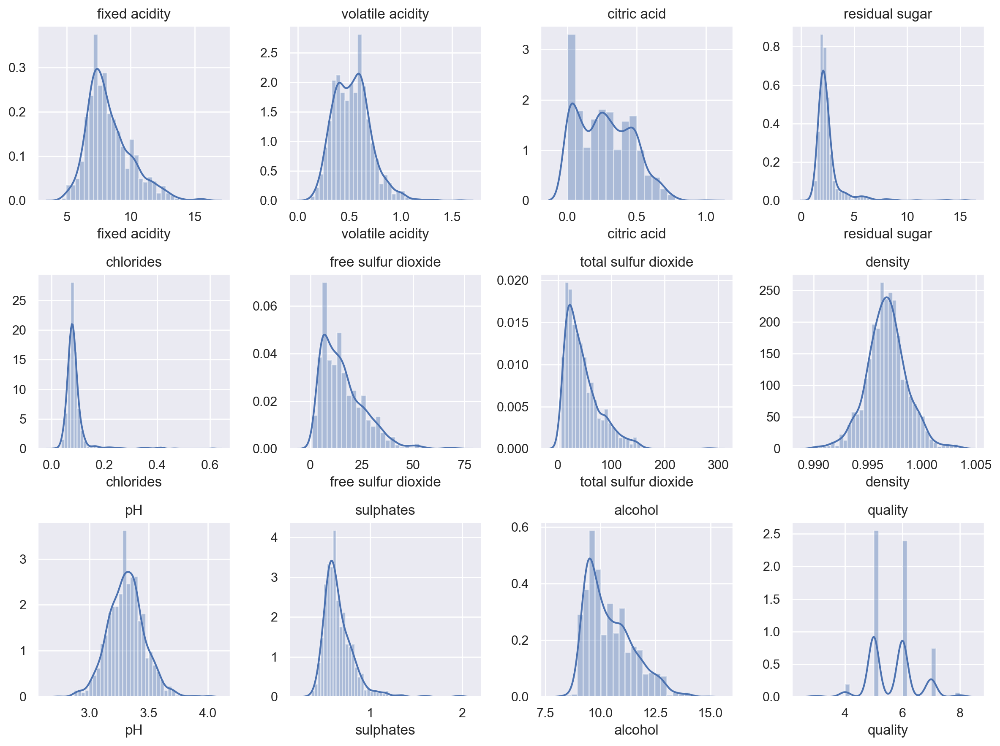

In [29]:
cols = 4
rows = 3
plt.figure(figsize=(12,9))
for index, value in enumerate(df.columns):
    plt.subplot(rows, cols, index + 1)
    sns.distplot(df[value])
    plt.title(value, fontsize=12)
    plt.ylabel('')
    plt.tight_layout()

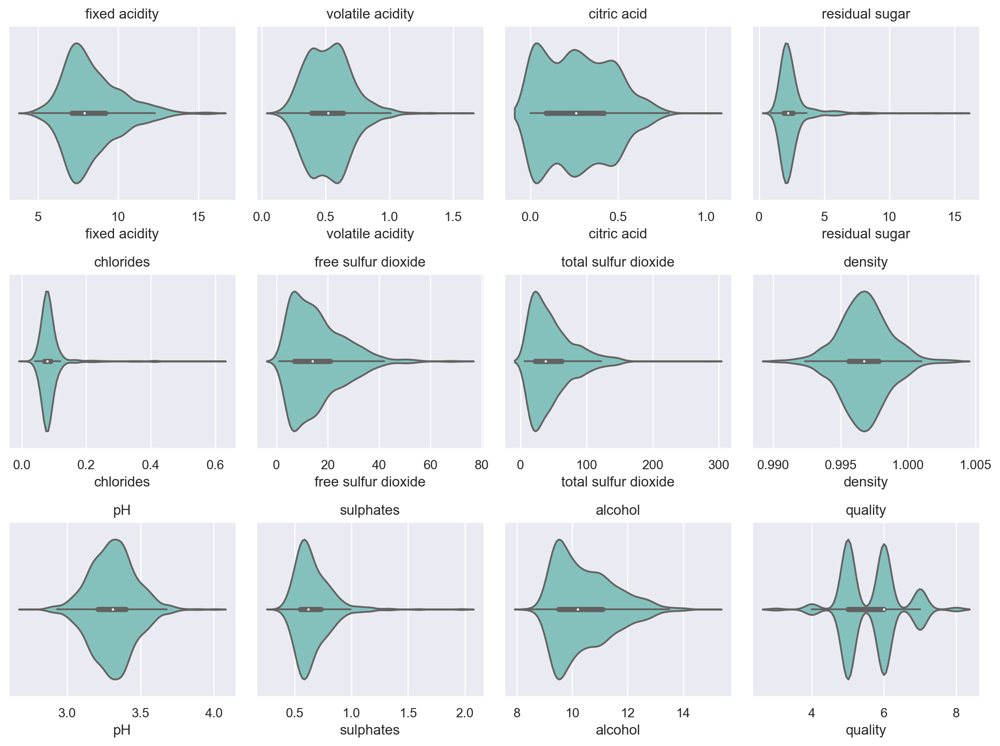

In [30]:
cols = 4
rows = 3
plt.figure(figsize=(12,9))
for index, value in enumerate(df.columns):
    plt.subplot(rows, cols, index + 1)
    sns.violinplot(df[value], palette='GnBu')
    plt.title(value, fontsize=12)
    plt.ylabel('')
    plt.tight_layout()

### Outliers multivariados

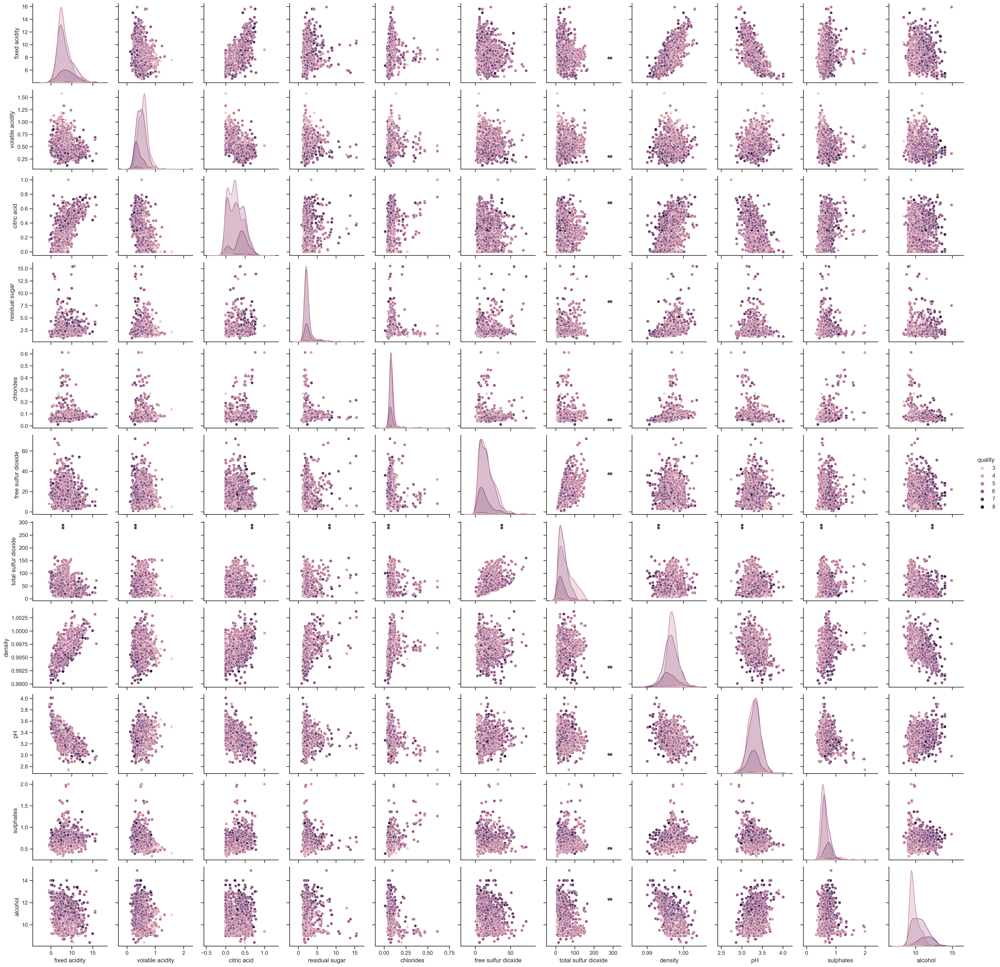

In [31]:
sns.set(style='ticks')
sns.pairplot(df, hue='quality');

In [32]:
df.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.124052
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.390558
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.226373
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,0.013732
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.128907
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.050656
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.185100
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.174919
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.057731
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.251397


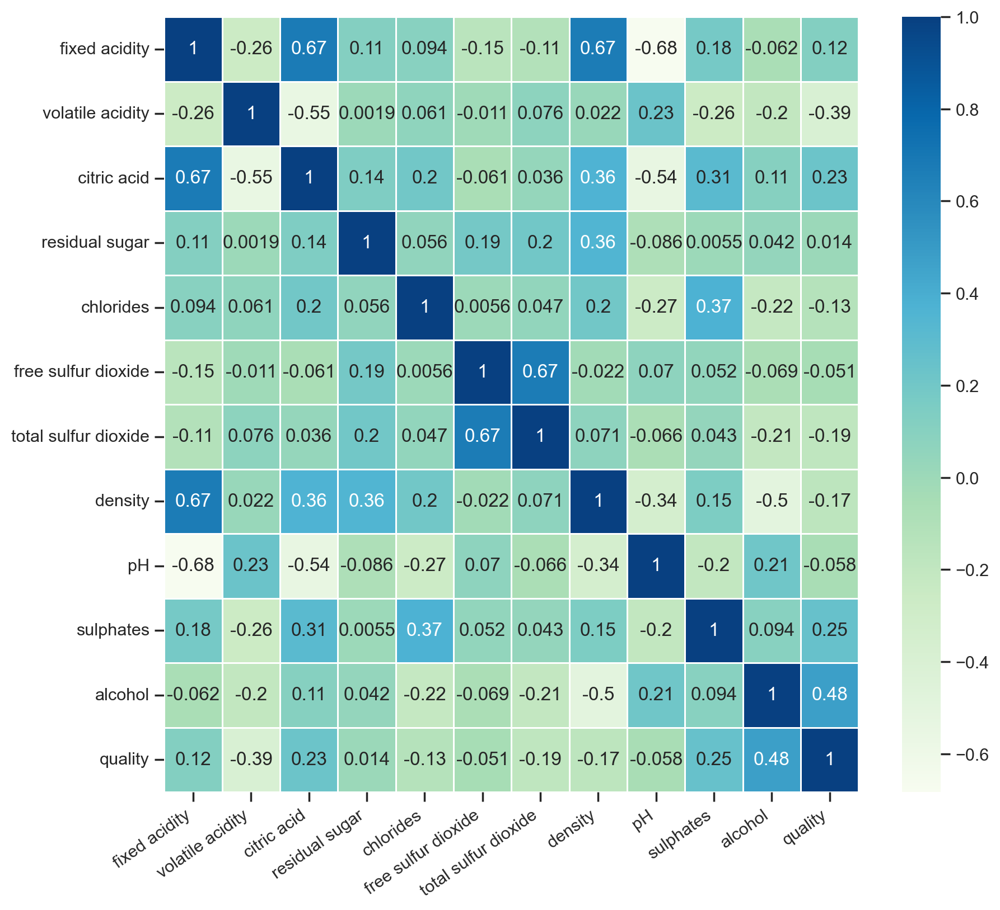

In [33]:
plt.subplots(figsize=(10,9))
sns.heatmap(df.corr(), annot=True, linewidths=.5, cmap='GnBu')
plt.xticks(rotation=35, ha='right');

In [34]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

# Ejercicio 3: Regularización de modelos

In [35]:
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

In [36]:
df_scaled

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,-0.528360,0.961877,-1.391472,-0.453218,-0.243707,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246,-0.787823
1,-0.298547,1.967442,-1.391472,0.043416,0.223875,0.872638,0.624363,0.028261,-0.719933,0.128950,-0.584777,-0.787823
2,-0.298547,1.297065,-1.186070,-0.169427,0.096353,-0.083669,0.229047,0.134264,-0.331177,-0.048089,-0.584777,-0.787823
3,1.654856,-1.384443,1.484154,-0.453218,-0.264960,0.107592,0.411500,0.664277,-0.979104,-0.461180,-0.584777,0.450848
4,-0.528360,0.961877,-1.391472,-0.453218,-0.243707,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246,-0.787823
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,-1.217796,0.403229,-0.980669,-0.382271,0.053845,1.542054,-0.075043,-0.978765,0.899886,-0.461180,0.072294,-0.787823
1595,-1.390155,0.123905,-0.877968,-0.240375,-0.541259,2.211469,0.137820,-0.862162,1.353436,0.601055,0.729364,0.450848
1596,-1.160343,-0.099554,-0.723916,-0.169427,-0.243707,1.255161,-0.196679,-0.533554,0.705508,0.542042,0.541630,0.450848
1597,-1.390155,0.654620,-0.775267,-0.382271,-0.264960,1.542054,-0.075043,-0.676657,1.677400,0.305990,-0.209308,-0.787823


In [37]:
df_scaled.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03,1.599000e+03
mean,3.435512e-16,1.699704e-16,4.335355e-16,-1.905223e-16,7.700046e-17,1.432042e-16,1.289532e-16,-3.482795e-14,3.002879e-15,7.639596e-16,9.437243e-16,-8.051373e-16
std,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00
min,-2.137045e+00,-2.278280e+00,-1.391472e+00,-1.162696e+00,-1.603945e+00,-1.422500e+00,-1.230584e+00,-3.538731e+00,-3.700401e+00,-1.936507e+00,-1.898919e+00,-3.265165e+00
25%,-7.007187e-01,-7.699311e-01,-9.293181e-01,-4.532184e-01,-3.712290e-01,-8.487156e-01,-7.440403e-01,-6.077557e-01,-6.551405e-01,-6.382196e-01,-8.663789e-01,-7.878226e-01
50%,-2.410944e-01,-4.368911e-02,-5.636026e-02,-2.403750e-01,-1.799455e-01,-1.793002e-01,-2.574968e-01,1.760083e-03,-7.212705e-03,-2.251281e-01,-2.093081e-01,4.508484e-01
75%,5.057952e-01,6.266881e-01,7.652471e-01,4.341614e-02,5.384542e-02,4.901152e-01,4.723184e-01,5.768249e-01,5.759223e-01,4.240158e-01,6.354971e-01,4.508484e-01
max,4.355149e+00,5.877976e+00,3.743574e+00,9.195681e+00,1.112703e+01,5.367284e+00,7.375154e+00,3.680055e+00,4.528282e+00,7.918677e+00,4.202453e+00,2.928190e+00


In [38]:
X = df_scaled.drop('quality', axis=1)
y = df_scaled['quality'] # asignamos como target la variable 'quality'

# Separamos los subsets de test y train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=42, shuffle=True)

### RIDGE

In [39]:
ridge_cv = RidgeCV(cv=10)
model_ridge = ridge_cv.fit(X_train, y_train)

In [40]:
def report_regularization(model, X_test, y_test):
    print(f'Valor del parámetro de regularización: {model.alpha_}')
    print(f'Coeficientes finales: \n {model.coef_}')
    y_hat = model.predict(X_test)
    print(f'MAE: {median_absolute_error(y_test,y_hat)}')
    print(f'RMSE: {mean_squared_error(y_test, y_hat, squared=False)}')
report_regularization(model_ridge, X_test, y_test)

Valor del parámetro de regularización: 10.0
Coeficientes finales: 
 [ 0.05171984 -0.22122281 -0.02862004  0.01735463 -0.10189407  0.06280238
 -0.14710856 -0.04461045 -0.06103819  0.17180412  0.37102758]
MAE: 0.5049691736036983
RMSE: 0.7719574117959532


In [41]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

### LASSO

In [42]:
lasso_cv = LassoCV(cv=10)
model_lasso = lasso_cv.fit(X_train, y_train)
report_regularization(model_lasso, X_test, y_test)

Valor del parámetro de regularización: 0.011266843992228987
Coeficientes finales: 
 [ 0.         -0.21485994 -0.          0.         -0.09162251  0.03463127
 -0.12215256 -0.         -0.05820333  0.15389476  0.38731718]
MAE: 0.5189379130363738
RMSE: 0.7751017515608977


### ELASTICNET

In [43]:
elastic_cv = ElasticNetCV(cv=10)
model_elastic = elastic_cv.fit(X_train, y_train)
report_regularization(model_elastic, X_test, y_test)

Valor del parámetro de regularización: 0.019598652649782625
Coeficientes finales: 
 [ 0.         -0.21395852 -0.          0.         -0.09322958  0.03754834
 -0.12505964 -0.         -0.05942415  0.15469553  0.38456393]
MAE: 0.5182080941600191
RMSE: 0.7749040231817501


    Según lo obtenido, el modelo implementado con Ridge presenta un mejor desempeño respecto a los otros dos, pero la diferencia es prácticamente nula.

    En el caso de Ridge este penalizó en gran medida los coeficientes de 'fixed acidity', 'citric acid', 'residual sugar', 'free sulfur dioxide', 'density' y 'pH'. 

    Para Lasso los coeficientes eliminados fueron 'fixed acidity', 'citric acid', 'residual sugar' y 'density'.

    Finalmente para elasticnet, los coeficientes eliminados fueron 'fixed acidity', 'citric acid', 'residual sugar' y 'density', y los penalizados fueron 'chlorides', 'free sulfur dioxide' y 'ph'.


    Los atributos que mantienen un comportamiento similar a lo largo de cada modelo son: 'volatile acidity', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'pH', 'sulphates' y 'alcohol'.